# STARmap MPFC benchmark

This notebook keeps the original STARmap outputs and groups the main preparation, STEP fitting, and external-method comparison branches used for the benchmark.

- Biological task: spatial-domain identification across STARmap MPFC sections.
- Main outputs: processed STARmap object, STEP domain labels, imported BASS/PRECAST labels, and benchmark figures.
- Expected local inputs: STARmap tables or premerged `.h5ad` objects under `./data/mpfc_160/`.

**Data source:** Mouse medial prefrontal cortex STARmap data from [STARmap Resources](https://www.starmapresources.org/data).

In [1]:
import os
from pathlib import Path

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from sklearn.metrics import adjusted_rand_score

from step import stModel

sc.settings.figdir = './results/STARmap'
sc.set_figure_params(dpi_save=300, figsize=(6, 4.5))
st_file = './data/mpfc_160/merged3.h5ad'


/opt/conda/envs/base/lib/python3.9/site-packages/scipy/__init__.py:132: UserWarning: A NumPy version >=1.21.6 and <1.28.0 is required for this version of SciPy (detected version 1.21.5)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Rebuild the benchmark-ready merged object

These cells reconstruct the merged object with explicit spatial coordinates and ground-truth labels.


In [2]:
adatas = {}
for i, batch in enumerate(['20180419_BZ9_control', '20180424_BZ14_control', '20180417_BZ5_control']):
    cnts = pd.read_csv(f"./data/mpfc_160/{batch}_cnts.csv", index_col=0)
    meta = pd.read_csv(f"./data/mpfc_160/{batch}.csv", index_col=0)
    adatas[batch] = ad.AnnData(cnts.T, obs=meta)
adata = ad.concat(adatas, label='batch')
adata.obs['Centroid_X'] = adata.obs_names.to_series().apply(lambda x: int(x.split('x')[0]))
adata.obs['Centroid_Y'] = adata.obs_names.to_series().apply(lambda x: int(x.split('x')[1]))

In [3]:
adata.obsm['spatial'] = adata.obs[['Centroid_X', 'Centroid_Y']].values
adata.obs['gd'] = adata.obs['z'].astype(int).astype('category')

In [4]:
adata.write_h5ad("./data/mpfc_160/merged3.h5ad")

## Train STEP and obtain benchmark-aligned domain labels

This is the main benchmark path used to fit STEP on the merged STARmap dataset.


In [2]:
model_config = dict(
    n_glayers=4,  # range of smooth, tuning from range 1 - 4
    max_neighbors=30, # number of neighbors of spots used to smooth
    # dec_norm=None,
)

run_config = dict(
    epochs=800, # training epoch for encoding RNA counts
    batch_size=512, # batch size: 512, 1024, 2048
    graph_batch_size=1, # 1 or 2
    n_iterations=1600, # training epoch for smoothing
    beta=1e-2, # 1e-2 to 1e-5
    kl_cutoff=None,
    e2e=True,
)

In [3]:
client = stModel(
    file_path=st_file,
    n_top_genes=None,
    geneset_to_use=None,
    batch_key='batch',
    layer_key=None,
    coord_keys=['Centroid_X', 'Centroid_Y'],
    module_dim=20,
    hidden_dim=40,
    n_modules=8,
    decoder_type='zinb',
    use_earlystop=False,
    edge_clip=None,
    variational=True,
    **model_config,
    # beta=1e-3,
)

[Warning] Using all genes
Adding count data to layer 'counts'
Dataset Done
Modeling with 1 components
{'variational': True, 'input_dim': 166, 'hidden_dim': 40, 'module_dim': 20, 'decoder_input_dim': None, 'n_modules': 8, 'edge_clip': None, 'decoder_type': 'zinb', 'n_glayers': 4}


In [4]:
client.run(split_rate=0.,
           gsplit_rate=0.,
           **run_config)
adata = client.adata

Training with e2e pattern
Training graph with multiple batches


In [5]:
sc.pp.neighbors(adata, use_rep='X_smoothed', n_neighbors=30)
sc.tl.umap(adata)

In [6]:
client.cluster(adata, use_rep='X_smoothed', n_clusters=4,)
# adata.write_h5ad('./results/MERFISH/processed.h5ad')

In [50]:
sc.tl.leiden(adata, resolution=0.08)

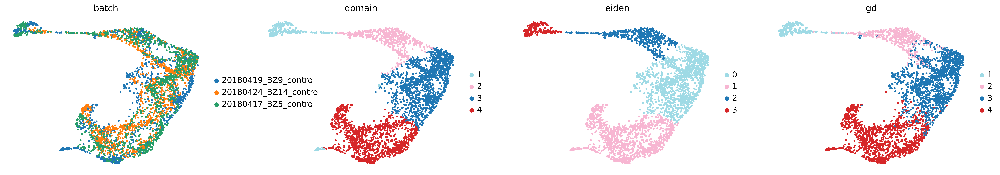

In [43]:
sc.pl.umap(adata, color=['batch', 'domain', 'leiden', 'gd'])

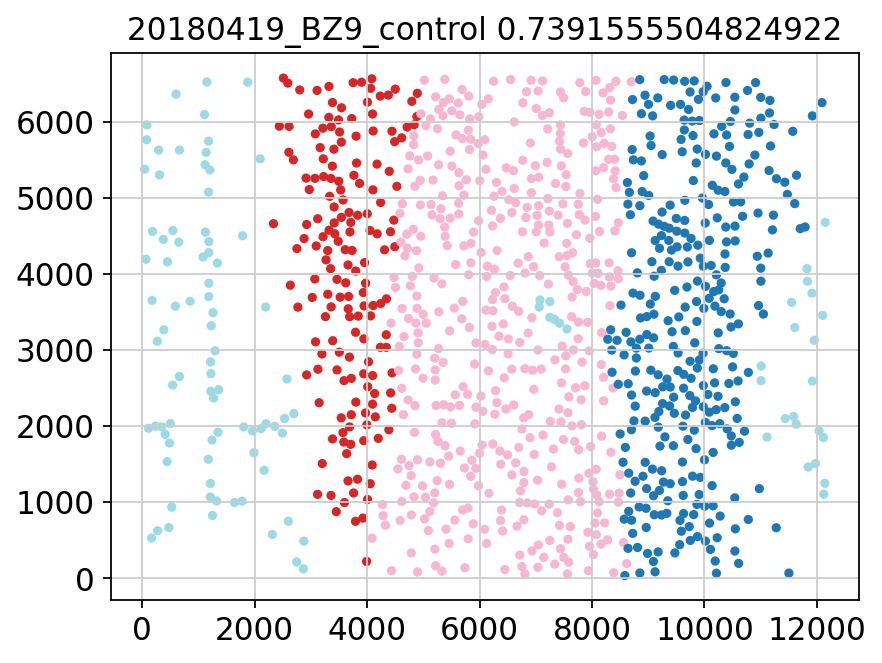

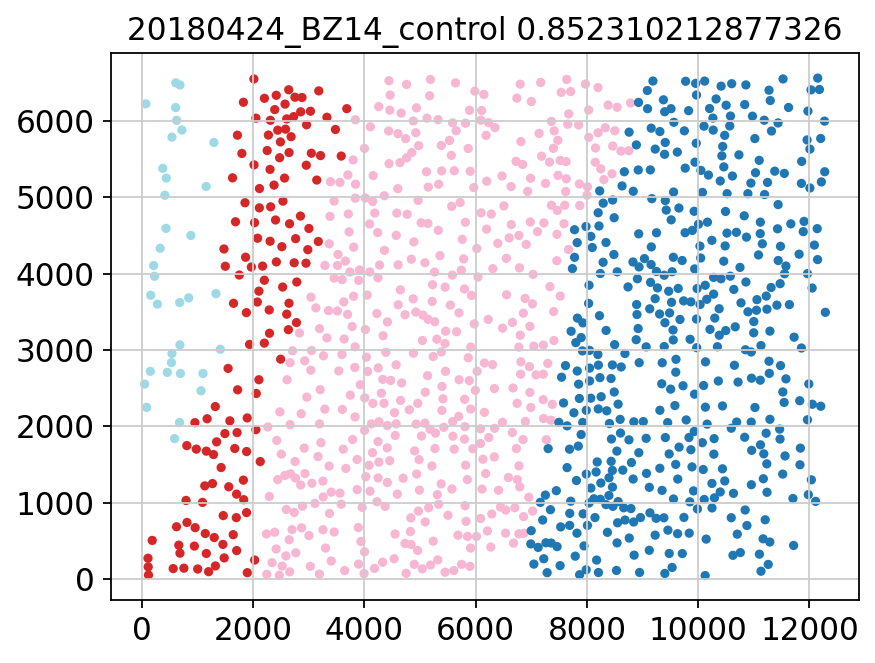

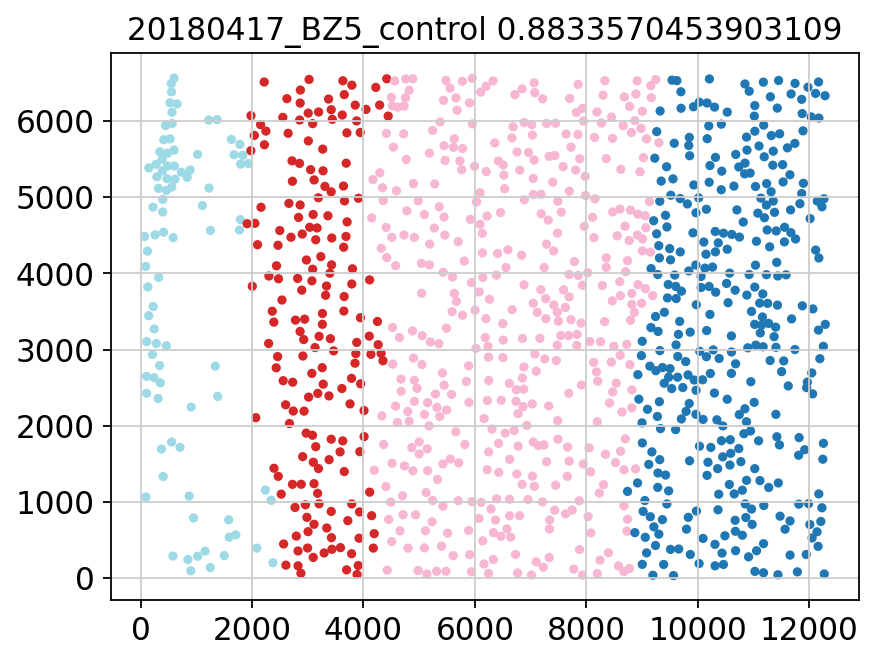

In [11]:
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    ari = adjusted_rand_score(_adata.obs['domain'].cat.codes, _adata.obs['gd'].cat.codes)
    plt.title(f"{batch} {ari}")
    plt.scatter(x=_adata.obs['Centroid_X'],
            y=_adata.obs['Centroid_Y'],
            c=_adata.obs['domain'].values.astype(int),
            s=10, cmap='tab20')
    plt.show()

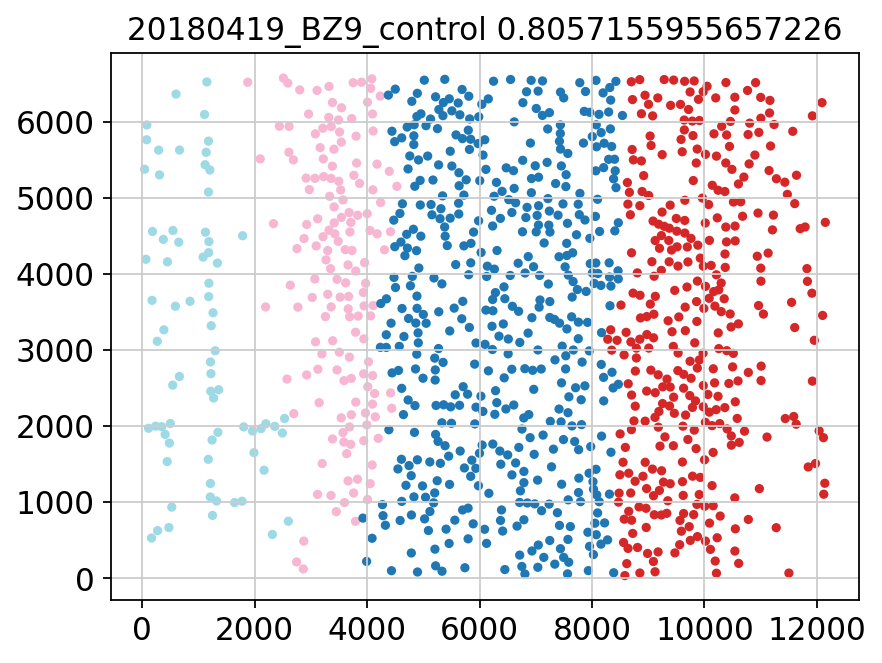

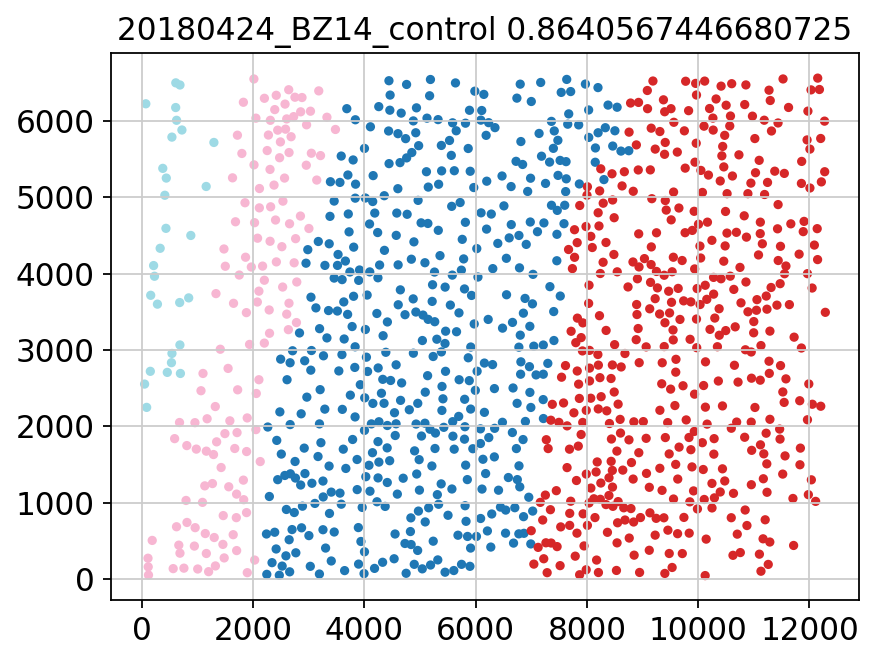

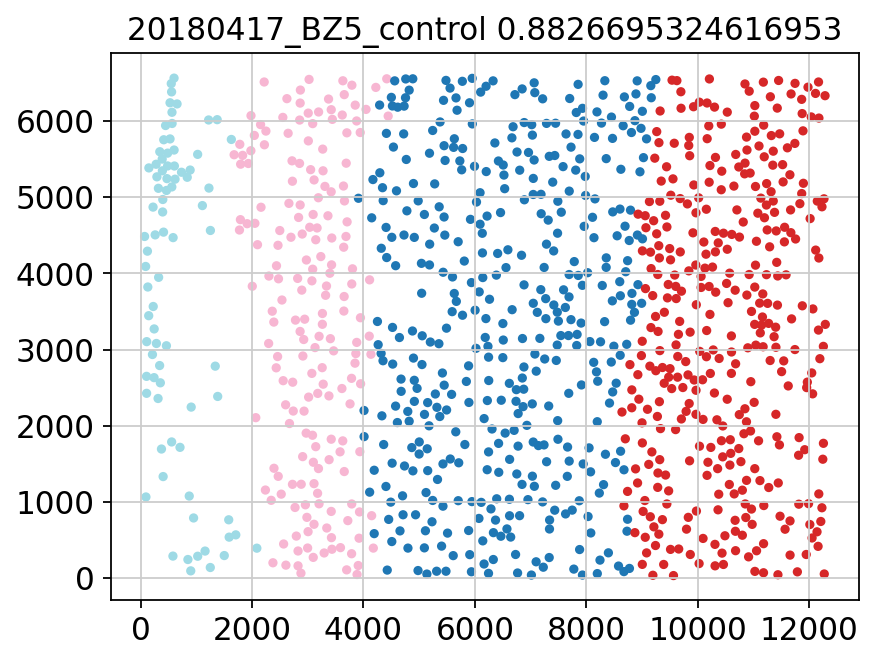

In [13]:
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    ari = adjusted_rand_score(_adata.obs['leiden'].cat.codes, _adata.obs['gd'].cat.codes)
    plt.title(f"{batch} {ari}")
    plt.scatter(x=_adata.obs['Centroid_X'],
            y=_adata.obs['Centroid_Y'],
            c=_adata.obs['leiden'].values.astype(int),
            s=10, cmap='tab20')
    plt.show()

In [10]:
adata.write_h5ad("./results/STARmap/processed.h5ad")

In [37]:
adata.obs['domain'] = adata.obs['domain'].apply(lambda x: [3, 1, 2, 4][x - 1])
adata.obs['domain'].cat.set_categories([1, 2, 3, 4], ordered=False, inplace=True)
adata.obs['domain']

44x5377       1
68x4194       1
84x5959       1
80x5764       1
114x1974      1
             ..
12271x4981    4
12290x6336    4
12276x51      4
12295x3331    4
12261x1768    4
Name: domain, Length: 3188, dtype: category
Categories (4, int64): [1, 2, 3, 4]

In [40]:
sc.settings.figdir = './results/STARmap/'
sc.set_figure_params(dpi=300, dpi_save=300, frameon=False, figsize=(6, 4.5))

colors = ['#9EDAE5', '#F7B6D2', '#1F77B4', '#D62628']
adata.uns['gd_colors'] = colors
adata.uns['domain_colors'] = colors
adata.uns['leiden_colors'] = colors

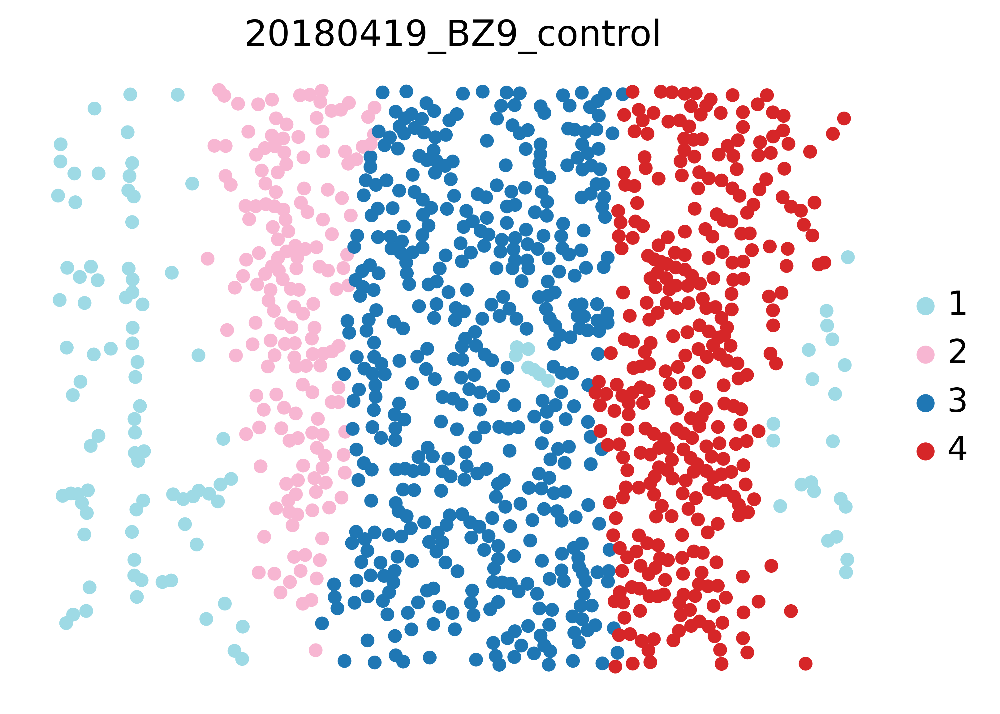

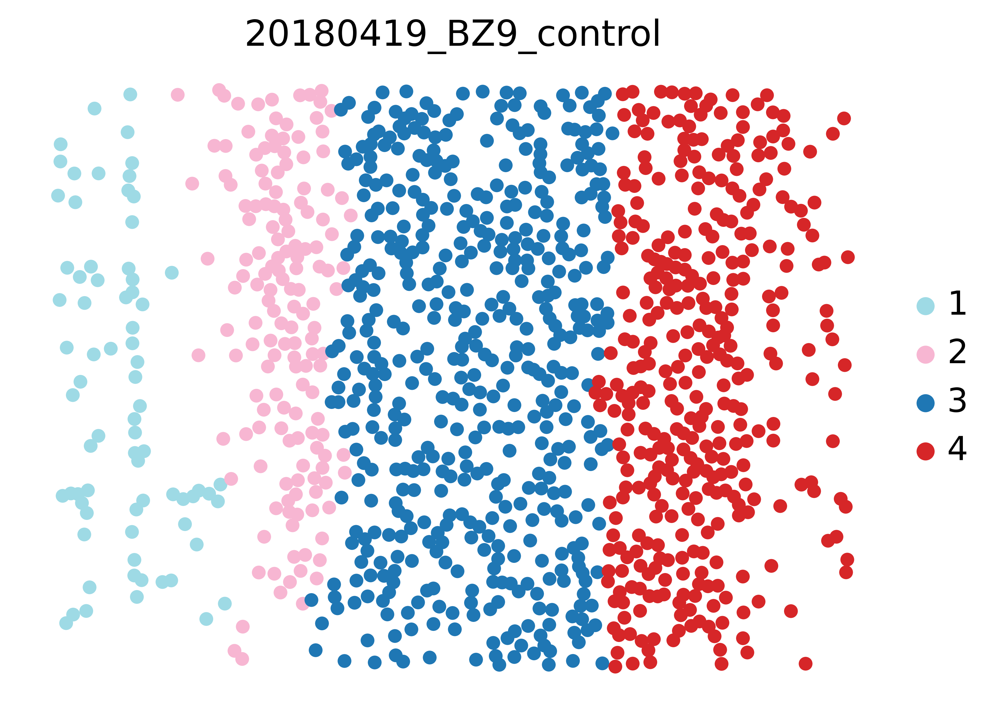

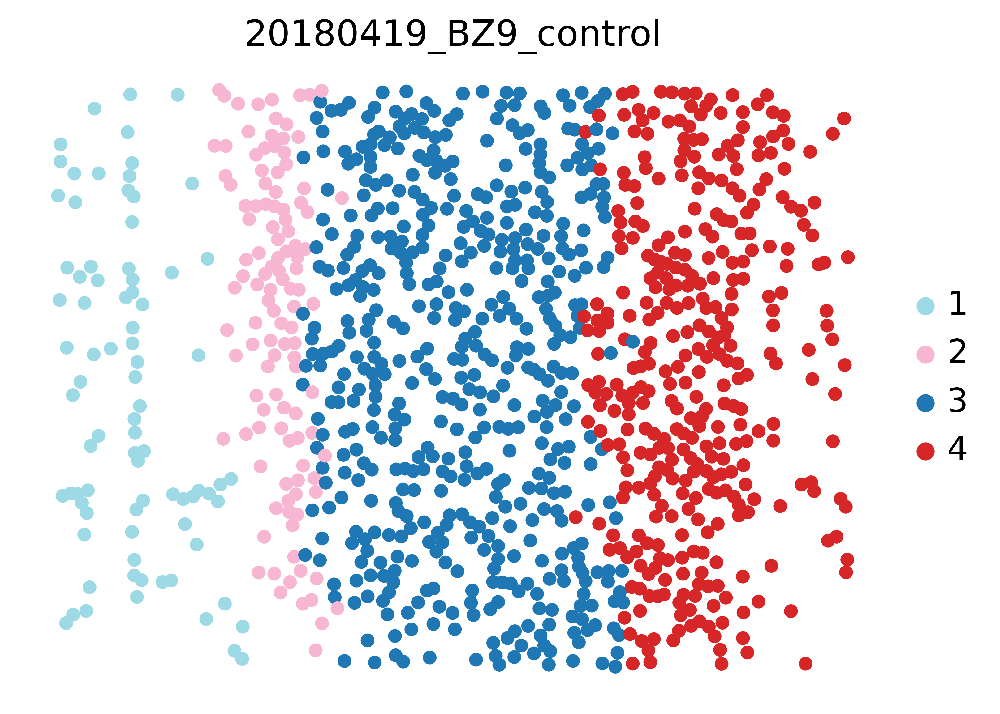

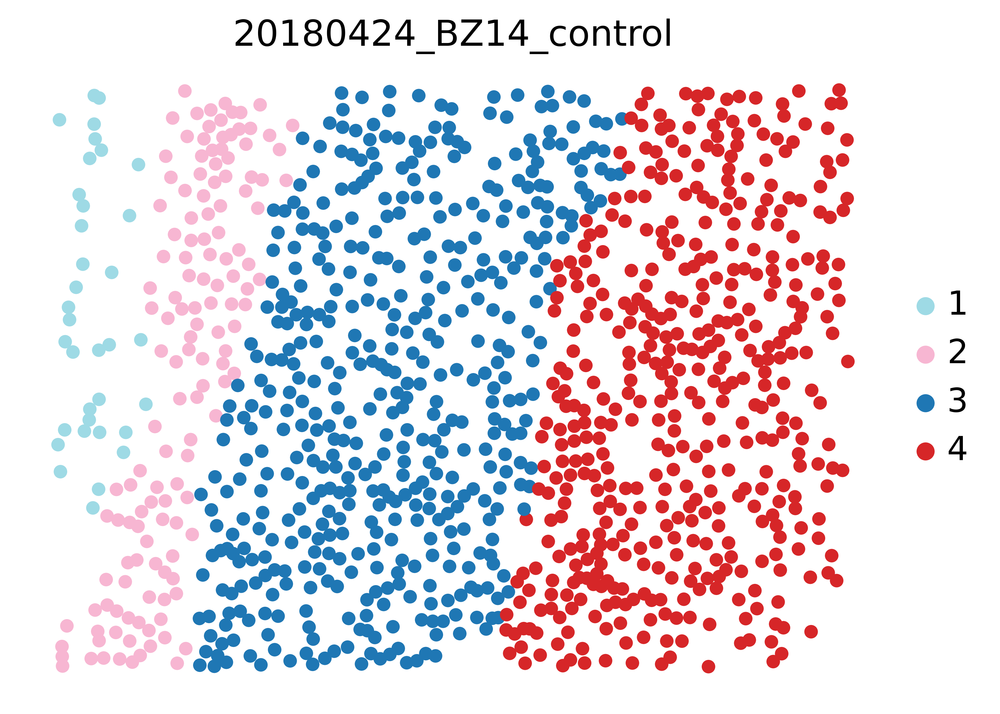

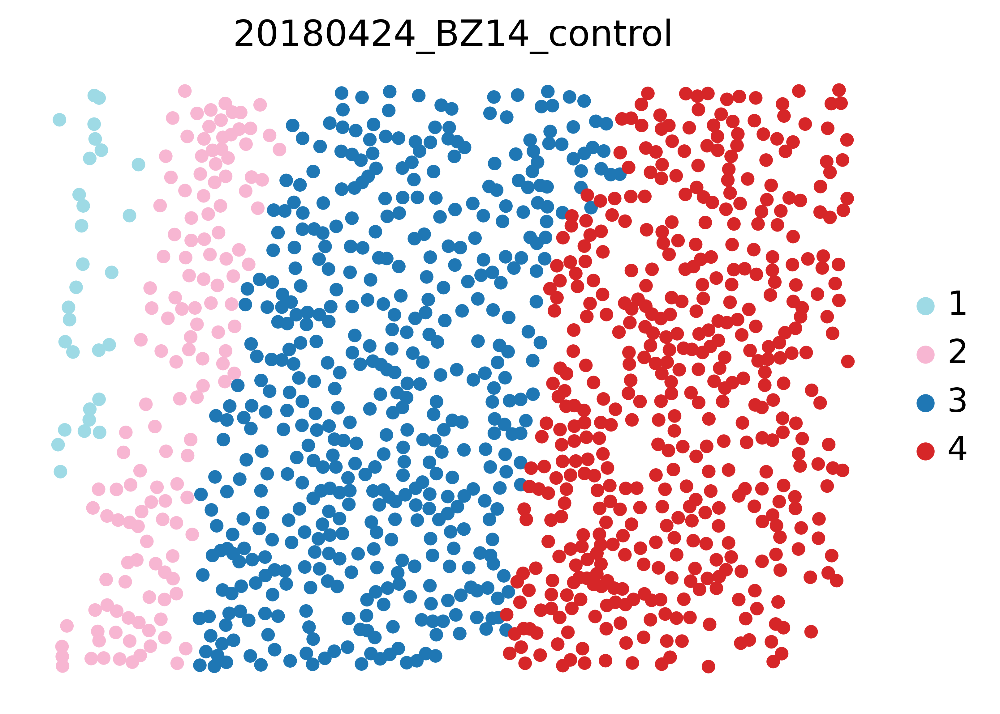

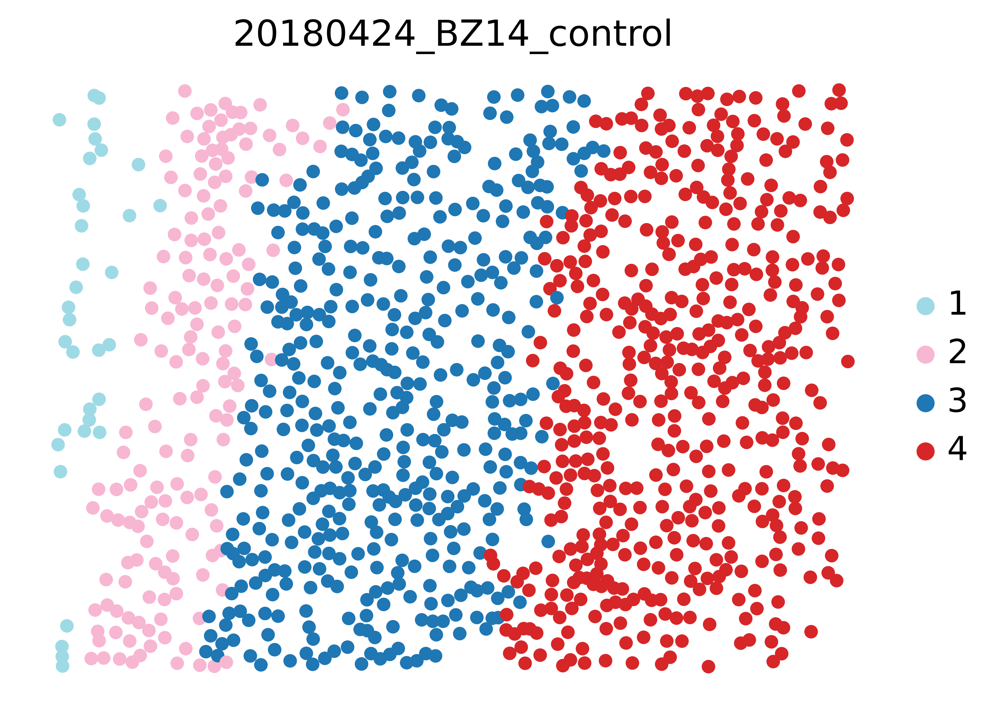

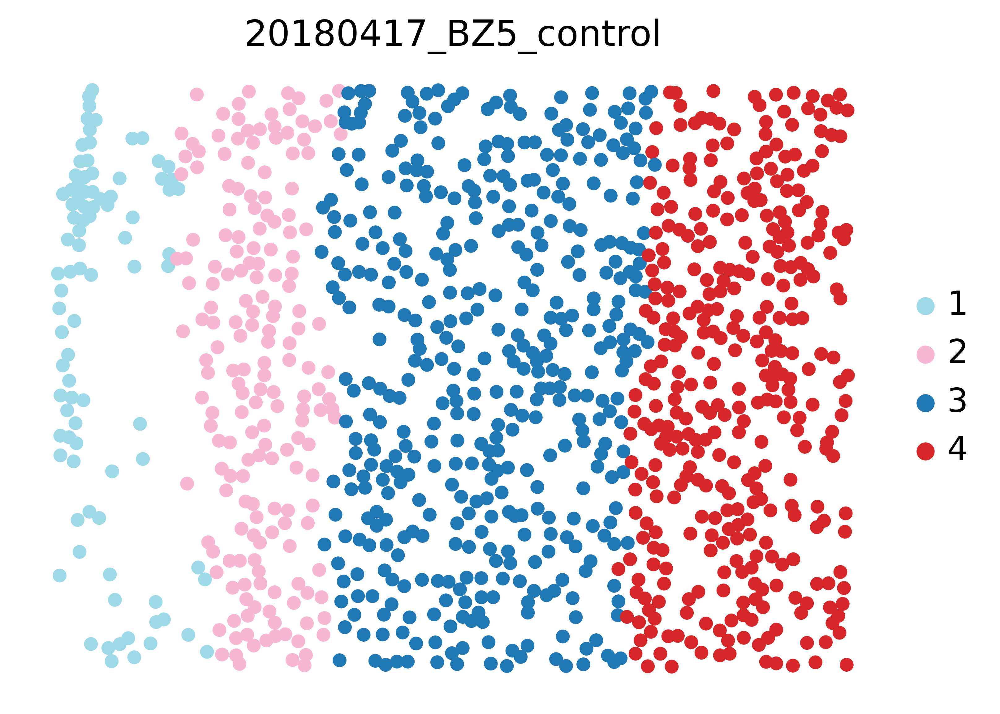

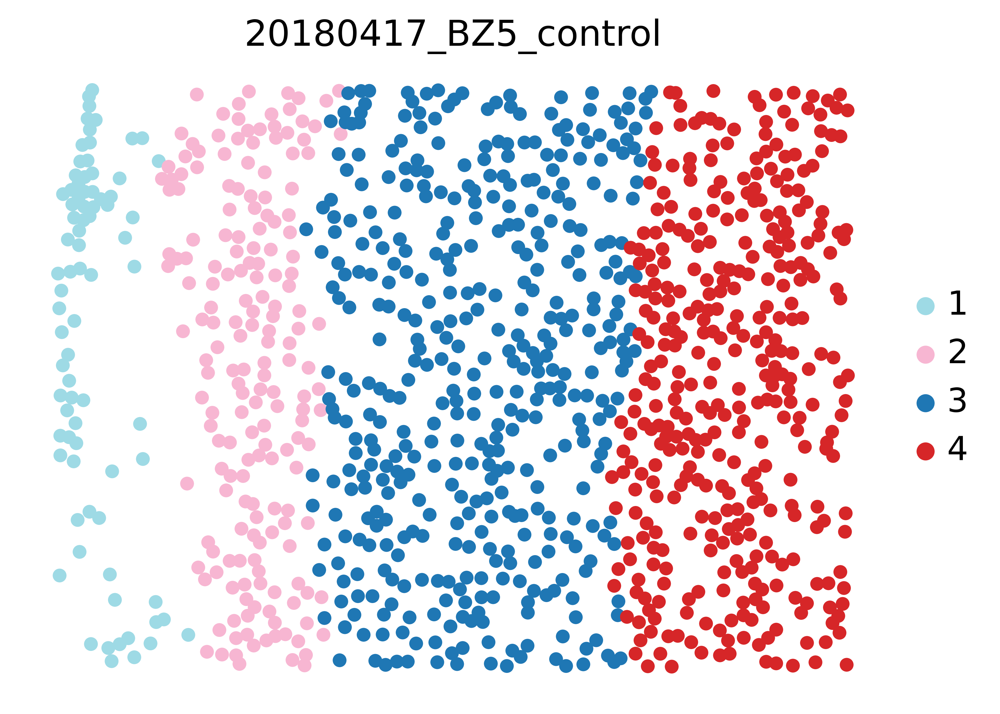

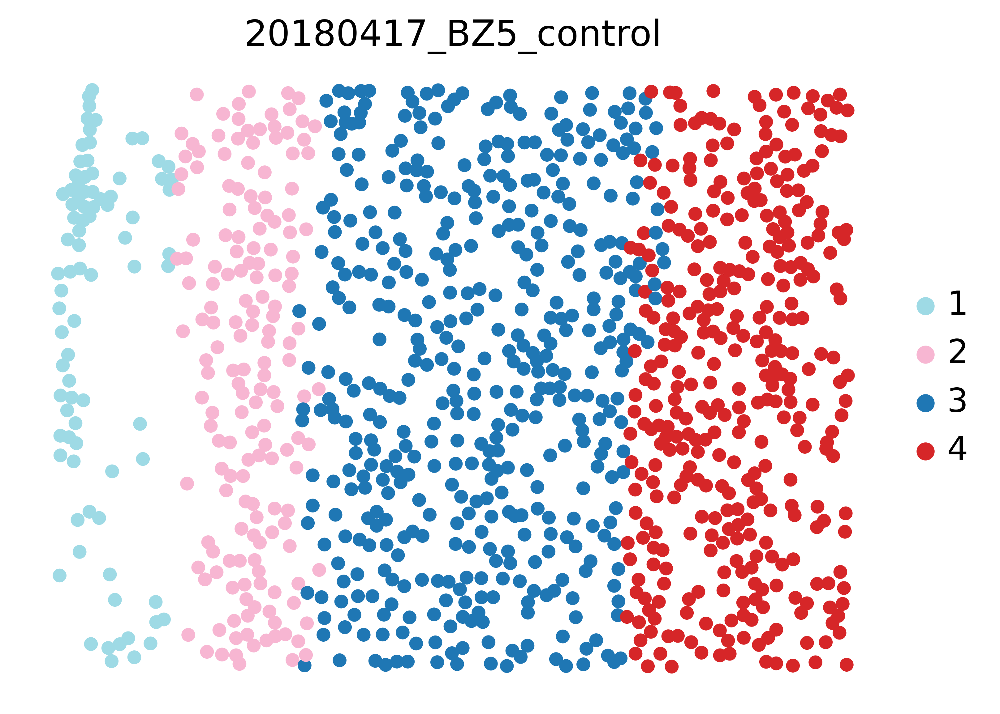

In [52]:
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    for key in ['domain', 'leiden', 'gd']:
        ari = adjusted_rand_score(_adata.obs[key].cat.codes, _adata.obs['gd'].cat.codes)
        sc.pl.embedding(_adata, color=key, title=batch, basis='spatial', save=f'_{batch}_{key}_{ari: .2f}_spatial.png')

In [53]:
adata.write_h5ad("./results/STARmap/processed.h5ad")

## Import BASS labels for side-by-side comparison

Load the BASS results onto the same processed object.


In [2]:
adata = sc.read_h5ad("./results/STARmap/processed.h5ad")

In [5]:
adata.obs['bass'] = 0
for batch in adata.obs['batch'].cat.categories:
    adata.obs.loc[adata.obs['batch'] == batch, 'bass'] = pd.read_csv(f"./data/mpfc_160/starmap_{batch}_bass.csv", index_col=0)['bass_label']

In [6]:
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    ari = adjusted_rand_score(_adata.obs['bass'], _adata.obs['gd'].cat.codes)
    print(ari)

0.660782531788005
0.7740640655583159
0.8653475711488513


## Import PRECAST labels and embeddings

This branch aligns PRECAST outputs to the shared STARmap object for downstream comparison.


In [ ]:
df = pd.read_csv(f"./data/mpfc_160/starmap_precast.csv", index_col=0)


In [10]:
df['batch'] = df['batch'].map({
    3: '20180424_BZ14_control',
    2: '20180419_BZ9_control',
    1: '20180417_BZ5_control'
})

In [11]:
adata.obs['precast'] = 0
df['batch'] = df['batch'].astype('category')
for batch in df['batch'].cat.categories:
    adata.obs.loc[adata.obs['batch'] == batch, 'precast'] = df.loc[df['batch'] == batch, 'cluster']

In [12]:
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    ari = adjusted_rand_score(_adata.obs['precast'], _adata.obs['gd'].cat.codes)
    print(ari)

0.42947680340647476
0.5353715160352043
0.48636146162706556


## Generate benchmark plots and summary metrics

The final cells turn the aligned objects into the spatial plots, DE summaries, and comparison metrics used for inspection.


In [11]:
sc.set_figure_params(dpi=300)
sc.settings.figdir = "./results/STARmap/"

In [13]:
adata.obs['bass'] = adata.obs['bass'].astype('category')
adata.obs['precast'] = adata.obs['precast'].astype('category')

In [18]:
colors = ['#9EDAE5', '#F7B6D2', '#1F77B4', '#D62628']
adata.uns['bass_colors'] = [colors[i] for i in [1, 3, 2, 0]]
adata.uns['precast_colors'] = [colors[i] for i in [1, 3, 2, 0]]

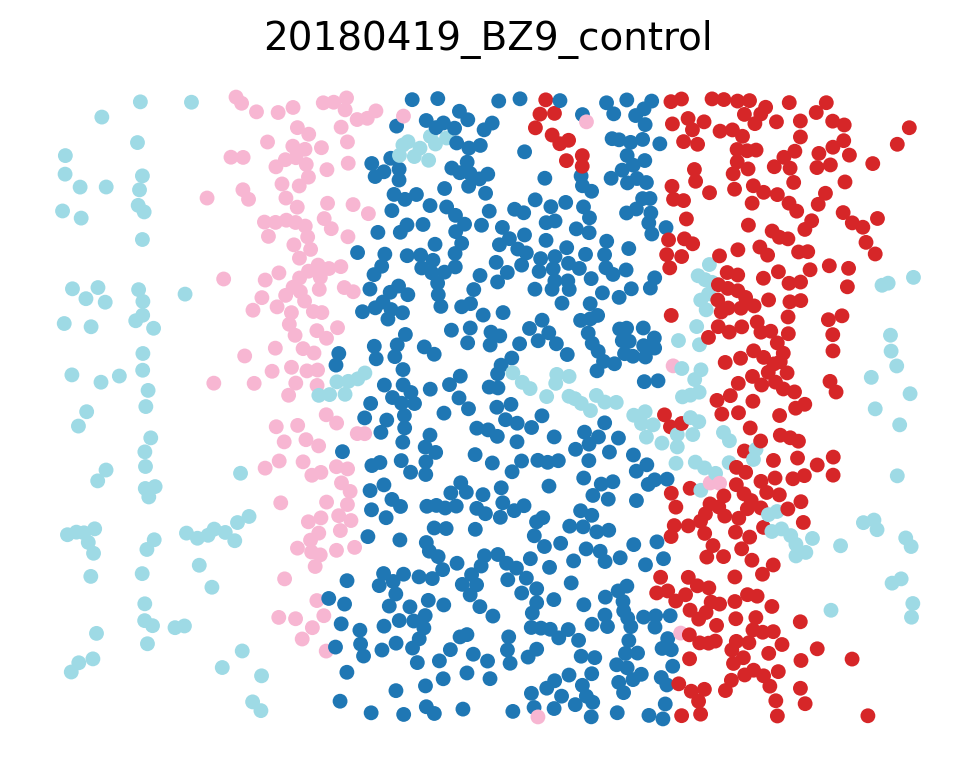

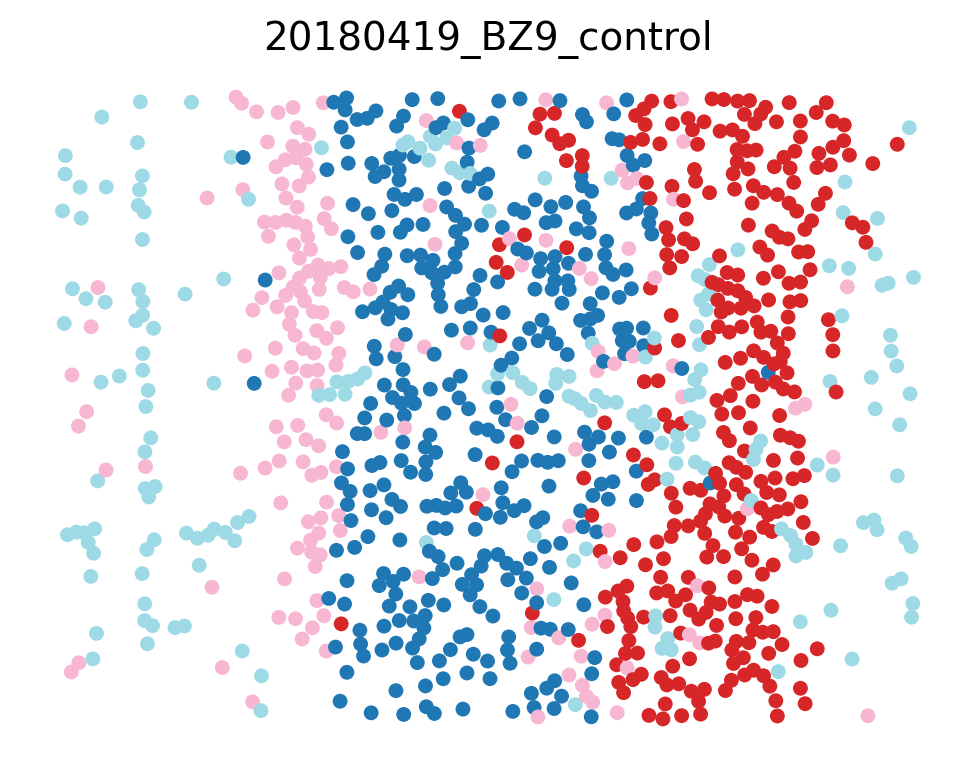

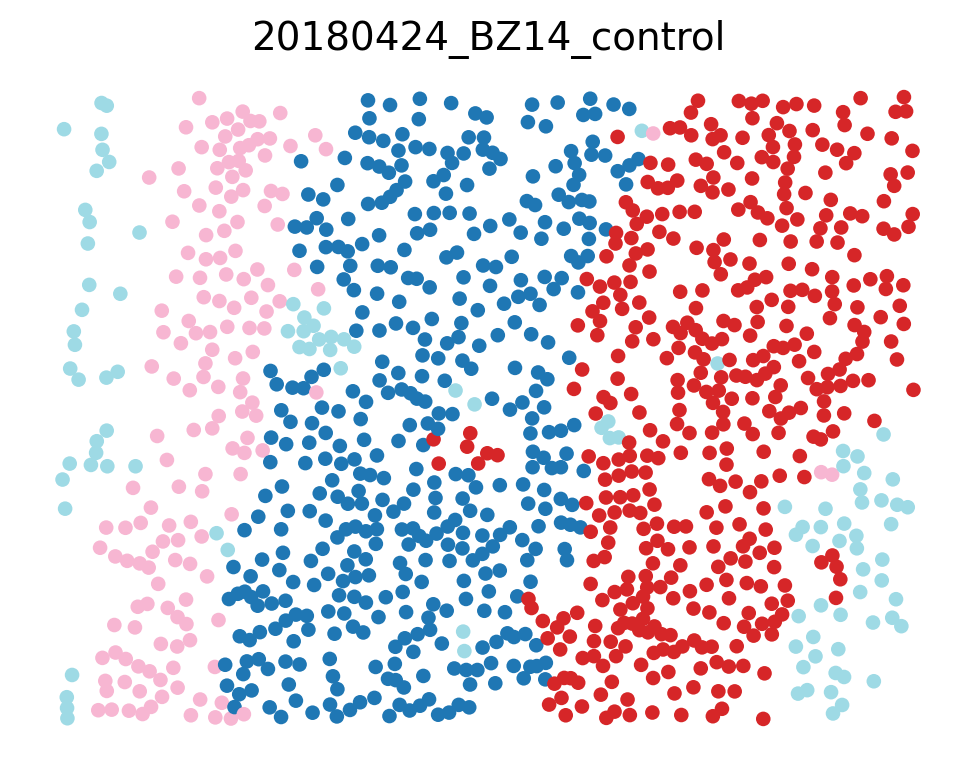

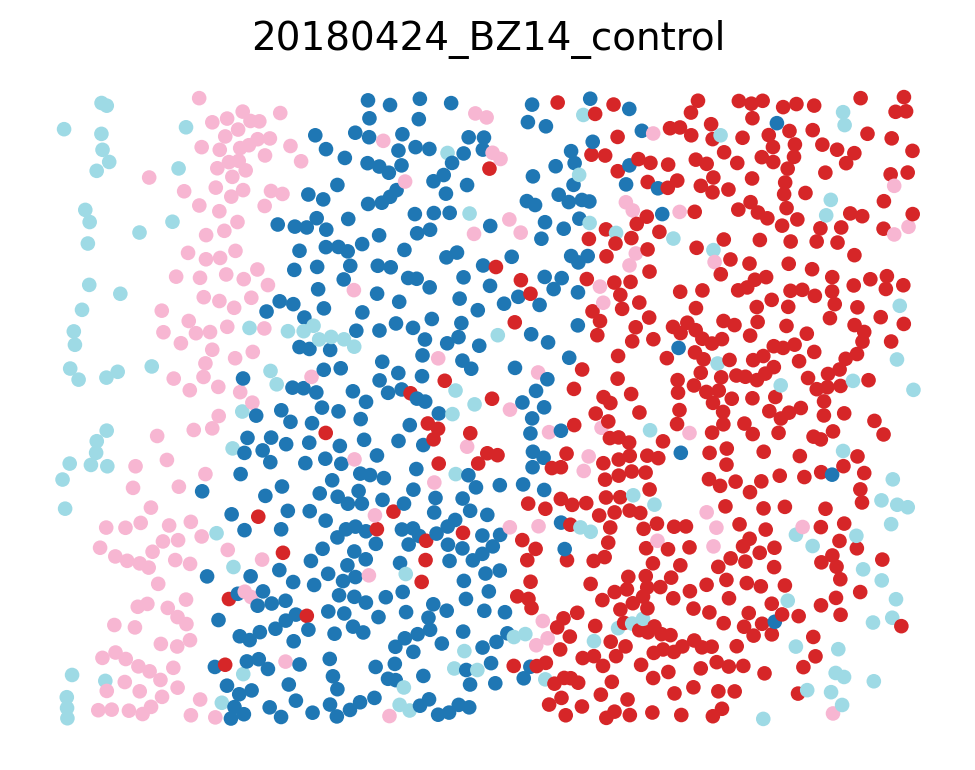

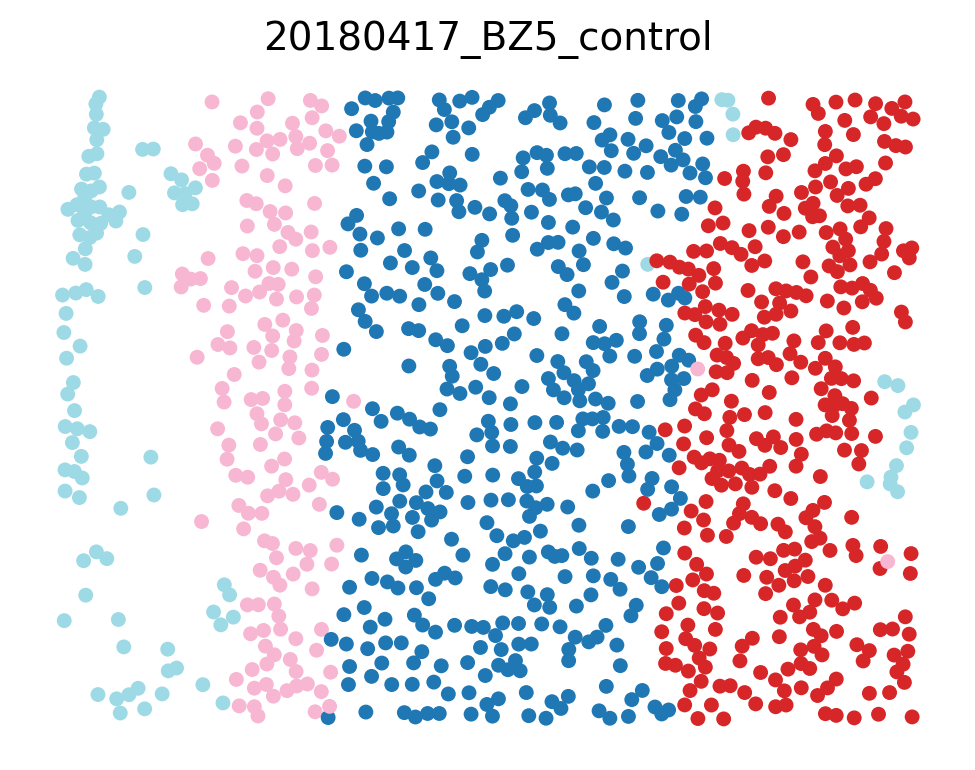

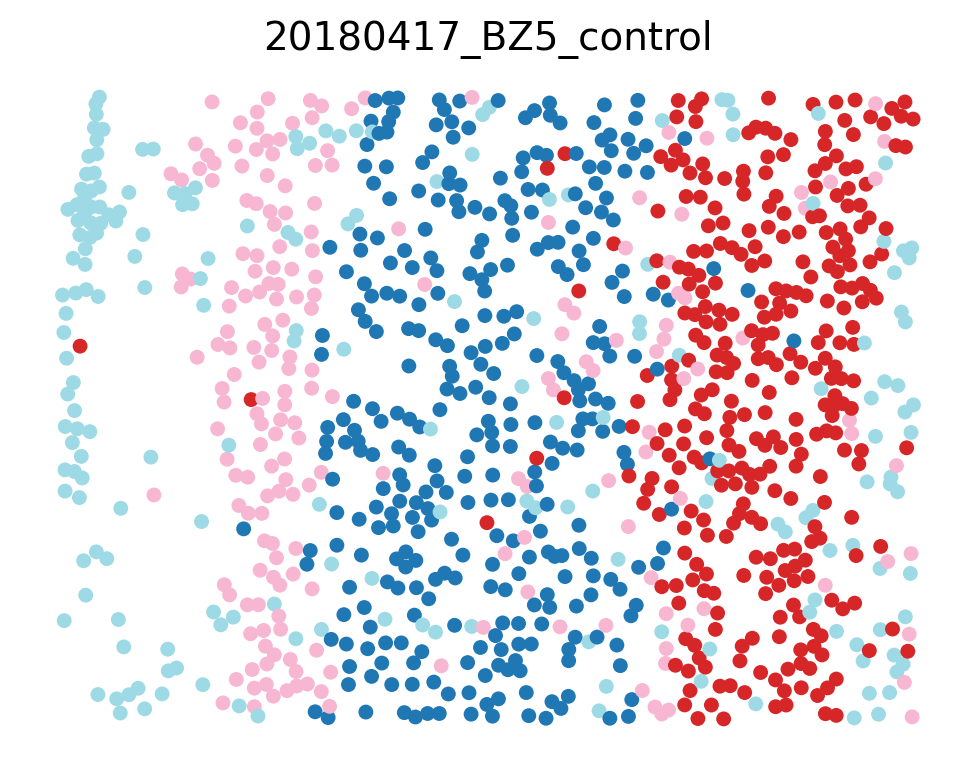

In [20]:
sc.set_figure_params(dpi=300, dpi_save=300, frameon=False, figsize=(6, 4.5))
for batch in adata.obs['batch'].unique():
    _adata = adata[adata.obs['batch'] == batch]
    for key in ['bass', 'precast']:
        ari = adjusted_rand_score(_adata.obs[key].cat.codes, _adata.obs['gd'].cat.codes)
        sc.pl.embedding(_adata, color=key, title=batch, basis='spatial', save=f'_{batch}_{key}_{ari:.2f}_spatial.png', legend_loc=None)
        # sc.pl.embedding(_adata, color=key, title=f"{key} {batch}", basis='spatial')

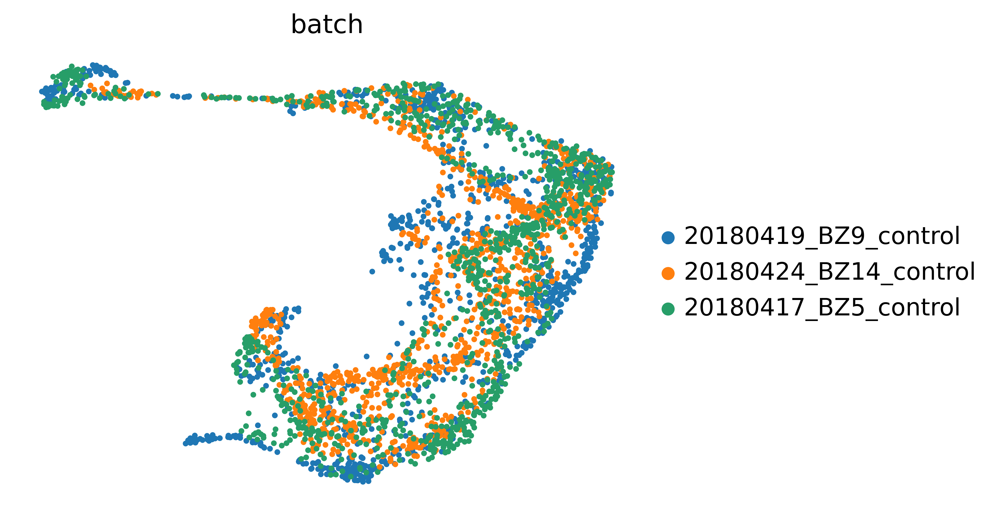

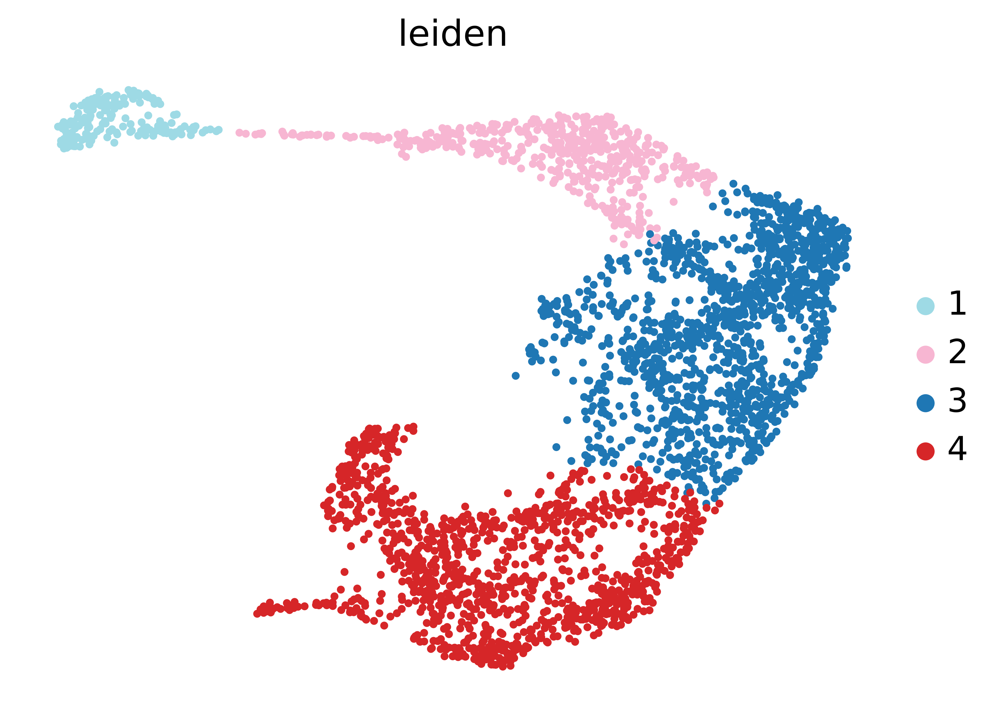

In [108]:
sc.set_figure_params(dpi=300, dpi_save=300, frameon=False, figsize=(6, 4.5))
for key in ['batch', 'leiden']:
    sc.pl.umap(adata, color=key, save=f'_{key}_step.png')

In [27]:
plot_df = pd.DataFrame(index=adata.obs['batch'].cat.categories, columns=['STEP+KMeans', 'STEP+Leiden', 'BASS-Mult', 'PRECAST'])
grouped = adata.obs.groupby('batch')

plot_df['STEP+KMeans'] = [adjusted_rand_score(grouped.get_group(batch)['domain'], grouped.get_group(batch)['gd'].cat.codes) for batch in adata.obs['batch'].cat.categories]
plot_df['STEP+Leiden'] = [adjusted_rand_score(grouped.get_group(batch)['leiden'], grouped.get_group(batch)['gd'].cat.codes) for batch in adata.obs['batch'].cat.categories]
plot_df['PRECAST'] = [adjusted_rand_score(grouped.get_group(batch)['precast'], grouped.get_group(batch)['gd'].cat.codes) for batch in adata.obs['batch'].cat.categories]
plot_df['BASS-Mult'] = [adjusted_rand_score(grouped.get_group(batch)['bass'], grouped.get_group(batch)['gd'].cat.codes) for batch in adata.obs['batch'].cat.categories]
plot_df

,STEP+KMeans,STEP+Leiden,BASS-Mult,PRECAST
20180419_BZ9_control,0.739156,0.805716,0.660783,0.429477
20180424_BZ14_control,0.852310,0.864057,0.774064,0.535372
20180417_BZ5_control,0.883357,0.882670,0.865348,0.486361


In [30]:
plot_df.index = plot_df.index.to_series().apply(lambda x: x.split('_')[1])

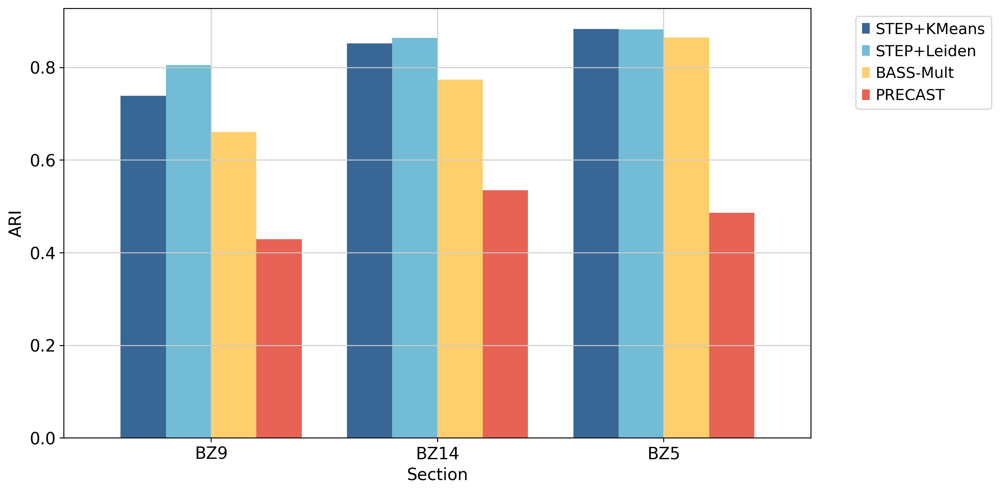

In [50]:
with plt.rc_context({"figure.figsize": (12, 6)}):
    ax = plot_df.plot(kind='bar', width=0.8, color=['#386795', '#72BCD6', '#FFCF6E', '#E86254'])
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)

    ax.grid(True, zorder=2)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_ylabel('ARI')
    ax.set_xlabel('Section')
    plt.tight_layout()